<a href="https://colab.research.google.com/github/WesDavi/Face_Detection_Python/blob/main/Exercicio_Reconhecimento_Facial.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

*   Desafio: Fazer o reconhecimento facial de pessoas em uma imagem utilizando o método de reconhecimento facial Cascade Classifier, HOG (Histograms of Oriented Gradients) e CNN fazendo as configurações com os parâmetros necessários para que não exista falso positivo e nem rostos sem reconhecimento.


# Detecção Facial utilizando o método Cascade Classifier

In [6]:
import cv2
from google.colab.patches import cv2_imshow

In [7]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [8]:
detector_facial = cv2.CascadeClassifier('/content/drive/MyDrive/Reconhecimento Facial/haarcascade_frontalface_default.xml')
imagem1 = cv2.imread('//content/drive/MyDrive/Reconhecimento Facial/imagem1.jpg')
#importando o detector facial e a imagem

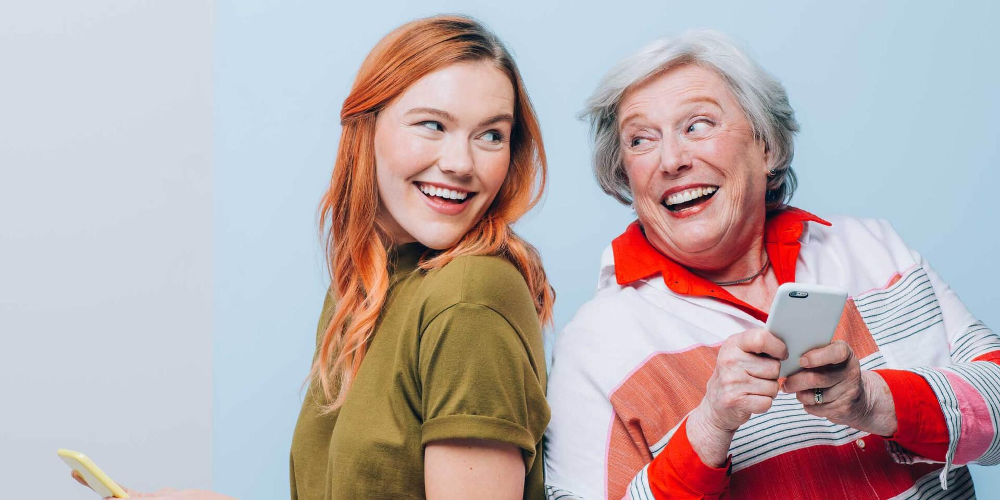

In [9]:
cv2_imshow(imagem1)

Após criado o detector facial e a imagem, para facilitar o processamento pode-se passar a imagem para escala de cinza e também modificar as dimensões da mesma

In [10]:
imagem1.shape

(960, 1920, 3)

In [11]:
imagem1 = cv2.resize(imagem1, (800, 600))
imagem1.shape
#redimensionando a imagem

(600, 800, 3)

In [12]:
imagem1_cinza = cv2.cvtColor(imagem1, cv2.COLOR_BGR2GRAY)
#passando a imagem para a escala de cinza

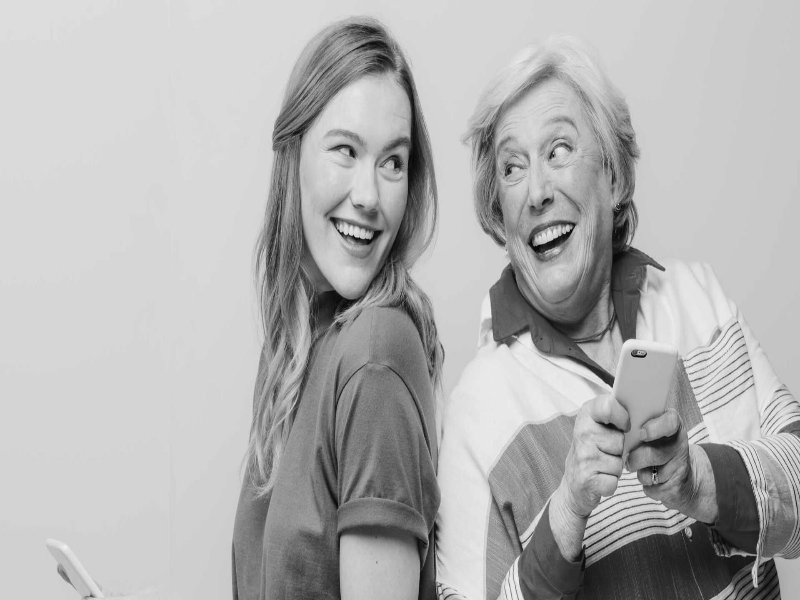

In [13]:
cv2_imshow(imagem1_cinza)

Após feito o tratamendo de dimensão e de canais (Ao invés de utilizar 3 canais de cores, passando pra escala de cinza utiliza-se apenas 1) pode-se montar o detector facial, passando os parametros necessários para a detecção de face no metodo Cascade Classifier.

In [14]:
faces = detector_facial.detectMultiScale(imagem1_cinza, scaleFactor = 1.01, minNeighbors = 5, minSize = (141, 141))
#criando o detector facial e passando ele para a imagem em escala de cinza e configurando os parametros

In [15]:
for x, y, h, w in faces:
  cv2.rectangle(imagem1, (x, y), (x + w, y + h), (0,255,0), 2)
  print (w, h)
#criando a bounding box para os rostos na imagem


175 175
177 177


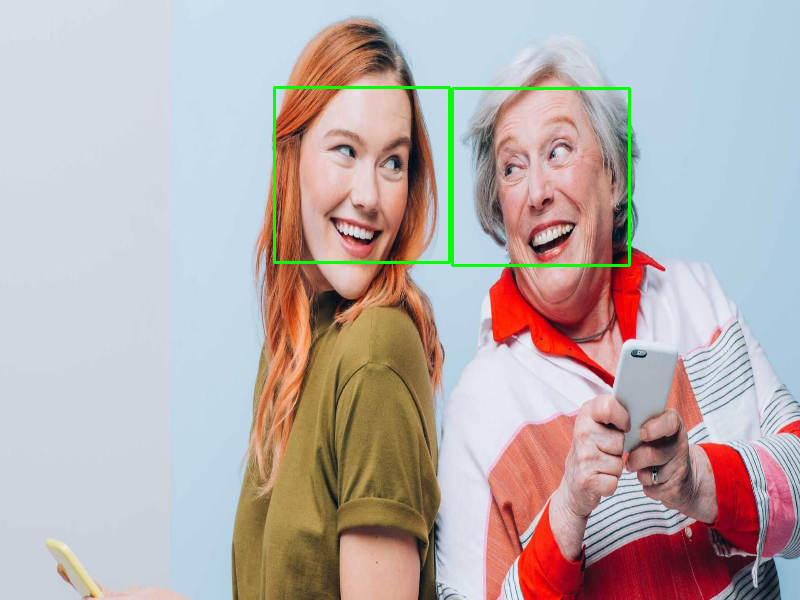

In [16]:
cv2_imshow(imagem1)

# Detecção facial utilizando HOG (Histograms of Oriented Gradients)

In [17]:
imagem2 = cv2.imread('/content/drive/MyDrive/Reconhecimento Facial/imagem2.png')
#Remontando a imagem

No caso do reconhecimento facial utilizando o metodo HOG não se fez a importação de um algoritmo já treinado (como no cascade classifier por exemplo), utiliza-se uma função da biblioteca dlib para isso.

In [18]:
import dlib

In [19]:
detector_facial_hog = dlib.get_frontal_face_detector()
#criando o detector facial atraves de um modelo treinado da biblioteca dlib

In [20]:
deteccoes_na_imagem = detector_facial_hog(imagem2, 1)
#Quando se utiliza a biblioteca dlib não é necessário fazer a conversão da imagem para a escala de cinza

Após essa etapa as detecções na imagem já foram encontradas, porém é preciso também desenhar a bouding box na imagem.

In [21]:
for rostos in deteccoes_na_imagem:
  direita, cima, esquerda, baixo = rostos.left(), rostos.top(), rostos.right(), rostos.bottom()
  #passando os valores da bounding box na imagem para as variaveis
  cv2.rectangle(imagem2, (direita, cima), (esquerda, baixo), (0,255,0), 2)

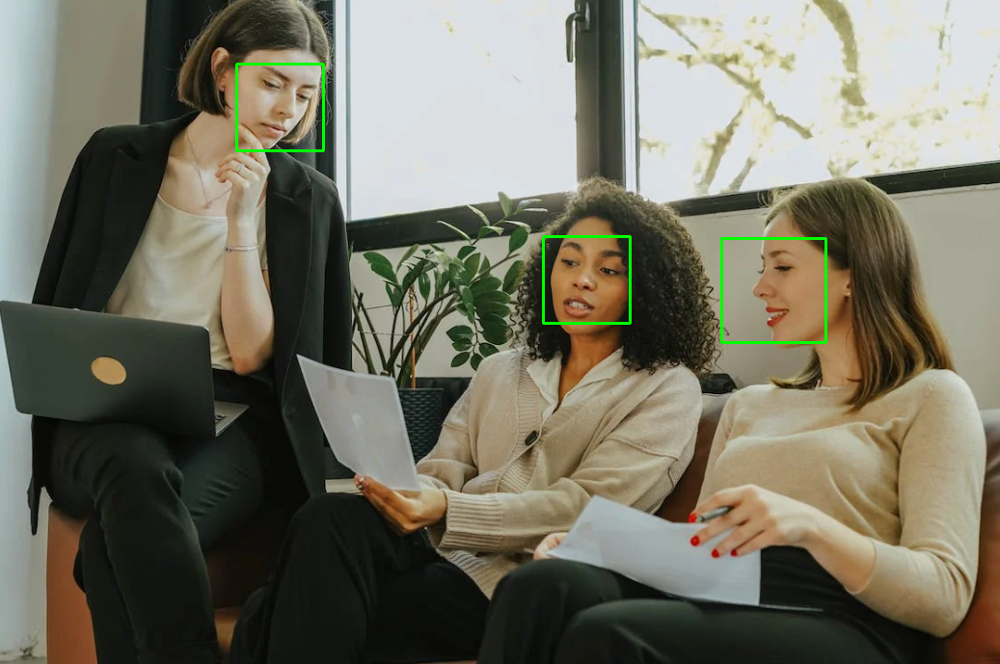

In [22]:
cv2_imshow(imagem2)

# Detecção Facial utilizando CNN (Redes Neurais Convolucionais)

In [23]:
imagem3 = cv2.imread('/content/drive/MyDrive/Reconhecimento Facial/imagem3.jpg')
#criando a variavel da imagem

In [24]:
detector_facial_cnn = dlib.cnn_face_detection_model_v1('/content/drive/MyDrive/Reconhecimento Facial/mmod_human_face_detector.dat')
#Criando o detector facial

In [25]:
deteccoes_cnn = detector_facial_cnn(imagem3, 1)
#Criando a variavel que vai armazenar os resultados

In [26]:
for rostos in deteccoes_cnn:
  direita, cima, esquerda, baixo, confianca = rostos.rect.left(), rostos.rect.top(), rostos.rect.right(), rostos.rect.bottom(), rostos.confidence
  #passando os valores da bounding box na imagem para as variaveis
  cv2.rectangle(imagem3, (direita, cima), (esquerda, baixo), (0,255,0), 3)

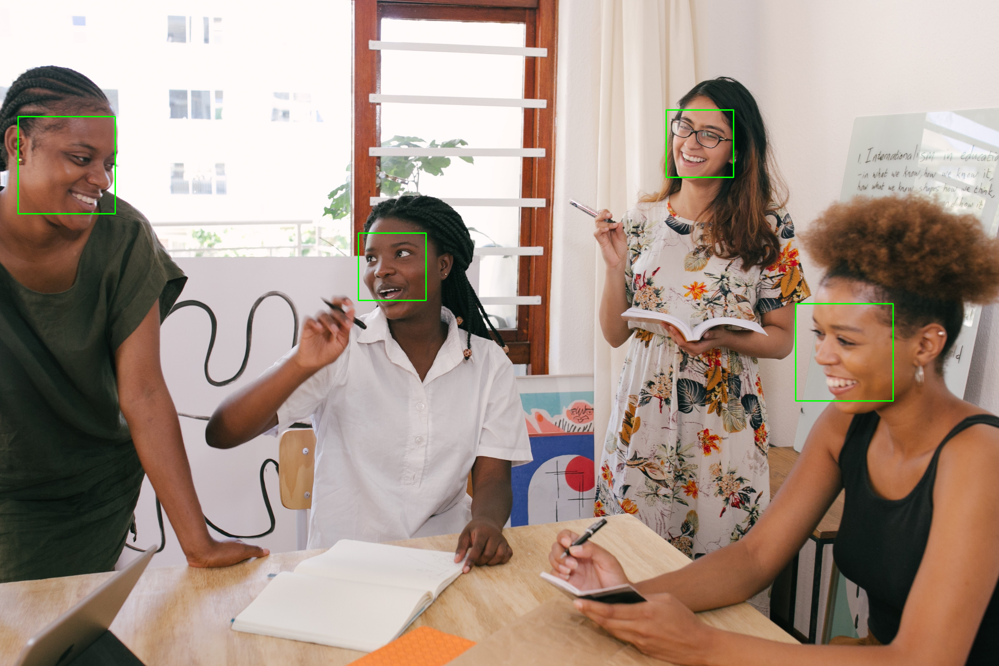

In [27]:
cv2_imshow(imagem3)